## Imports and global settings

In [1]:
from __future__ import absolute_import, division, print_function

import os
import numpy as np
import datetime
import gc
import h5py
import json
import glob
import re
import random
import matplotlib.pyplot as plt
import unittest
from itertools import izip
import glob

from IPython.display import FileLink
from IPython.core.debugger import Tracer

import keras
from keras.models import Sequential, Model
from keras.layers import Convolution2D, ZeroPadding2D, MaxPooling2D, Dense
from keras.layers import Lambda, Dropout, Flatten, Input, BatchNormalization
from keras.layers import GlobalAveragePooling2D, GlobalMaxPooling2D, Reshape
from keras.optimizers import Adam, Nadam, Adamax, Adadelta, Adagrad, RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras.utils.data_utils import get_file
from keras.callbacks import ModelCheckpoint
from keras.utils.np_utils import to_categorical
from keras.regularizers import l1, l1l2, l2
from keras.metrics import categorical_accuracy, categorical_crossentropy
from keras.layers.advanced_activations import LeakyReLU
from keras.models import model_from_json
from keras.applications.resnet50 import ResNet50
from keras.applications.inception_v3 import InceptionV3
from keras.applications.xception import Xception
from keras.models import model_from_json

import sys
# Add the parent folder path to the sys.path list
# sys.path.append('../')
import utils
reload(utils)
from utils import plots, remove_chars_re, plot_files, plot_images, load_array
from utils import save_array, MixIterator

%matplotlib inline

Using Theano backend.
Using gpu device 0: Tesla K80 (CNMeM is disabled, cuDNN 5103)
/home/ubuntu/anaconda2/lib/python2.7/site-packages/theano/sandbox/cuda/__init__.py:600: UserWarning: Your cuDNN version is more recent than the one Theano officially supports. If you see any problems, try updating Theano or downgrading cuDNN to version 5.
  warnings.warn(warn)


In [2]:
path = './'
batch_size = 64
image_size = (224, 224)
weights_file = 'vgg16_bn.h5'  # 'checkpoint-14.2-15.4.18-00-0.0883.hdf5'

## Useful routines

Maybe refactor to a separate file.

In [3]:
def get_batch(path, batch_size, shuffle=True, augument=False,
              class_mode='categorical', fill_mode='constant'):
    ''' Create a keras data generator, that flows the images from the specified 
    dir.
    '''
    if augument:
        data_generator = ImageDataGenerator(
            rotation_range=10,
            width_shift_range=0.05,
            height_shift_range=0.05,
            zoom_range=0.2,  # 0.75,
            channel_shift_range=10,
            shear_range=0.05,
            horizontal_flip=True,
            fill_mode=fill_mode
        )
    else:
        data_generator = ImageDataGenerator()
    return data_generator.flow_from_directory(directory=path,
                                              batch_size=batch_size,
                                              target_size=image_size,
                                              shuffle=shuffle,
                                              class_mode=class_mode)


def convolution(model, layers, filters):
    ''' Define a convolutional layer.
    '''
    for layer_index in range(layers):
        model.add(ZeroPadding2D((1, 1)))
        model.add(Convolution2D(filters, 3, 3, activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
    return model


def preprocess(image):
    '''Preprocessing the image: Sub imagenet mean values; Flip channels from RGB
    to BGR.
    '''
    # input is shaped (batch_size, channels, width, height)
    imagenet_means = np.asarray([123.68, 116.779, 103.939]).reshape([3, 1, 1])
    image -= imagenet_means
    # Flip the channels
    return image[:, ::-1, :, :]


def vgg16_model(dropout=0.5, batch_norm=True):
    '''Define the model, according to the VGG paper.
    '''
    model = Sequential()
    model.add(Lambda(preprocess, input_shape=(3, 224, 224)))
    model = convolution(model, 2, 64)
    model = convolution(model, 2, 128)
    model = convolution(model, 3, 256)
    model = convolution(model, 3, 512)
    model = convolution(model, 3, 512)
    model.add(Flatten())

    # Dense 1
    model.add(Dense(4096, activation='relu'))
    if batch_norm:
        model.add(BatchNormalization())
    model.add(Dropout(dropout))
    # Dense 2
    model.add(Dense(4096, activation='relu'))
    if batch_norm:
        model.add(BatchNormalization())
    model.add(Dropout(dropout))
    # Softmax output
    model.add(Dense(1000, activation='softmax'))
    return model


def get_model_name(model):
    '''Create unique model name (from the model layers). 
    Model name in the form:
        3xC64-1xC128-2xD4096-Drop0.5-BN 
        from model:
        Convolution2D(64)
        Convolution2D(64)
        Convolution2D(64)
        Convolution2D(128)
        Dense(4096)
        Dropout(0.5)
        BatchNormalization()
        Dense(4096)
        Dropout(0.5)
    '''
    model_name = ''
    repeating_layers_count = 1
    prev_layer_code = False
    dropout = 0
    batch_norm = False
    # Get the model config as json
    data = json.loads(model.to_json())
    if 'layers' in data['config']:
        layers = data['config']['layers']
    else:
        layers = data['config']
    for layer in layers:
        layer_code = False
        # Dont add conv layers to name for now
#         if layer['class_name'] == 'Convolution2D':
#             # Detect Convolution layers
#             layer_code = "C{}".format(layer['config']['nb_filter'])
        if layer['class_name'] == 'Dense':
            # Detect Dense layers
            layer_code = "D{}".format(layer['config']['output_dim'])
        elif layer['class_name'] == 'Dropout':
            dropout = layer['config']['p']
        elif layer['class_name'] == 'BatchNormalization':
            batch_norm = True

        if not layer_code:
            # Not Dense or conv layer, so dont compare with previous
            # dense or conv.
            continue

        # If there were previous layers
        if prev_layer_code:
            # Was the previous layer was the same as the current one?
            # (and this is not the first layer).
            if prev_layer_code == layer_code:
                # We are seeing repeating layers
                repeating_layers_count += 1
            else:
                # Not the same as the previous one
                # Add the prev layer(s) to the model desc
                # NB: Because we only add the layer after we have seen a diff
                # dense or conv one will miss the last layer in the model,
                # which is OK since it's the output layer anyway.
                model_name += ('{}x{}-').format(
                    repeating_layers_count,
                    prev_layer_code)
                repeating_layers_count = 1
        # The current layer will be the prev one in the next iteration
        prev_layer_code = layer_code

    # Add information about BN and dropout
    model_name += 'Drop{}'.format(dropout)
    if batch_norm:
        model_name += '-BN'
    return model_name


def create_dir(name):
    ''' Create a dir if not exists.
    '''
    if not os.path.exists(name):
        os.makedirs(name)


def save_architecture(model, model_name):
    '''Save the architecture of the model to a file named
        model_name.
    '''
    model_json = model.to_json()
    # Save in the dir name after the model
    filepath = os.path.join(model_name, model_name + '.json')
    with open(filepath, 'w') as f:
        f.write(model_json)


def get_name_and_save_model(model, prefix=''):
    '''Get the model name and save the model.
    Args:
        model: The keras model
    Returns: 
        The model name
    '''
    model_name = prefix + get_model_name(model)
    create_dir(model_name)
    save_architecture(model, model_name)
    return model_name


def get_weight_layers(weights_file):
    '''Display what is in the weights file
    '''
    f = h5py.File(weights_file, mode='r')
    return [n.decode('utf8') for n in f.attrs['layer_names']]


def vgg_load_weights(model, weights_file):
    '''Set the model weights with the weights from weights_file.'''
    # If file exists in current dir (keras get_file doesn't check current dir)
    if os.path.exists(weights_file):
        weights = weights_file
    elif os.path.exists(os.path.join('models', weights_file)):
        # ./models/weights_file
        weights = os.path.join('models', weights_file)
    elif os.path.exists(os.path.join('../', 'models', weights_file)):
        # ../models/weights_file
        weights = os.path.join('../', 'models', weights_file)
    else:
        # Get file uses downloaded weights (in keras cache)
        # or downloads them if not present.
        path = 'http://www.platform.ai/models/'
        weights_file = 'vgg16_bn.h5'
        weights = get_file(weights_file, path + weights_file,
                           cache_subdir='models')
    model.load_weights(weights)
    return model


def model_compile(model, optimizer=None, learning_rate=None):
    if not optimizer:
        optimizer = Adam()
    if learning_rate:
        optimizer.lr.set_value(learning_rate)
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy'])
    return model


def setup_imagenet_id_to_class():
    '''Decode the ids of the 1000 classes in the Imagenet competition for 
    humans.
    '''
    path = 'http://www.platform.ai/models/'
    class_mappings_filename = 'imagenet_class_index.json'
    mappings_file = get_file(class_mappings_filename, path +
                             class_mappings_filename, cache_subdir='models')
    with open(mappings_file, 'r') as f:
        mappings = json.load(f)

    return mappings


def imagenet_id_to_class(id):
    '''A convenience function to extract the class name
    '''
    return mappings[str(id)][1]


def vgg_finetune(model):
    ''' Pop the 1000 classes last layer off our model, and replace it with a 2 
    class (dog, cat).
    '''
    # Freeze the original model
    for layer in model.layers:
        layer.trainable = False
    # Replace the last layer
    model.pop()
    model.add(Dense(4096, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax', name='dense_2_softmax'))
    return model


def get_checkpoint(model_name, period=1):
    now = datetime.datetime.now()
    date_string = "{0}.{1}-{2}.{3}.{4}".format(
        now.day, now.month, now.hour, now.minute, now.second)
    filepath = os.path.join(
        model_name,
        '{val_loss:.4f}.hdf5')
    return ModelCheckpoint(filepath, save_weights_only=True,
                           period=period, save_best_only=True)


def get_last_layer(model, layer_type):
    '''Returns the last layer of type `layer_type` in `model`.
    '''
    # Traverse from the end, but keeping the original indexes.
    for original_index, layer in reversed(list(enumerate(model.layers))):
        # Found the last layer of this type
        if type(layer) == layer_type:
            return layer, original_index

    # Layer not found
    return None, None


def setup_model_features(input_shape, dropout=0.5, batch_norm=False,
                         num_dense=3):
    '''Setup the faster model.
    '''
    model = Sequential()
    for index in range(num_dense):
        # First layer gets input_shape
        if (index == 0):
            model.add(Dense(4096, activation='relu', init="he_normal",
                            input_shape=input_shape))
        else:
            model.add(Dense(4096, activation='relu', init="he_normal"))
        if batch_norm:
            model.add(BatchNormalization())
        model.add(Dropout(dropout))

    # Output
    model.add(Dense(2, activation='softmax'))
    return model


def change_dropout(model, previous_dropout, new_dropout):
    ''' Adjust the weights of the layers for new dropout probality.
    '''
    weight_scale = (1 - previous_dropout) / (1 - new_dropout)
    for layer_index, layer in enumerate(model.layers):
        if type(layer) is Dropout:
            # Find the previous Dense or Convolution2d layers and resize their
            # weights
            before_dropout_layers = model.layers[:layer_index]
            # We want to start with the nearest layers first
            for prev_layer in before_dropout_layers[::-1]:
                if (type(prev_layer) is Convolution2D
                    or type(prev_layer) is Dense
                        or type(prev_layer) is BatchNormalization):
                    # Found the layer to resize weights.
                    weights = prev_layer.get_weights()
                    # Weights include both weights and bias

                    new_weights = [w * weight_scale for w in weights]
                    # Set the new weights
                    prev_layer.set_weights(new_weights)
                    # We do this only for the first layer before the dropout
                    break
    return model


def create_model(dropout=0.5, batch_norm=False, learning_rate=None,
                 weights_file=None, save_period=1, num_dense=3,
                 previous_dropout=0.5):
    # Input is 512 * 7 * 7 vector
    model = setup_model_features(input_shape=(25088,),
                                 dropout=dropout,
                                 batch_norm=batch_norm,
                                 num_dense=num_dense)
    if weights_file:
        model.load_weights(weights_file)

    # Change Dropout amount by adjusting weights
    if dropout != previous_dropout:
        model = change_dropout(
            model,
            previous_dropout=previous_dropout,
            new_dropout=dropout)

    model.name = get_name_and_save_model(model)
    checkpoint = get_checkpoint(model_name=model.name, period=save_period)

    model = model_compile(model, learning_rate=learning_rate)
    return model, checkpoint


def create_full_model(weights_file, fc_weights_file, save_period=1,
                      learning_rate=None):
    # Load a VGG16 modelvgg_finetune
    model = vgg16_model()
    # Pop the last Dx1000 and add Dx4096, BN, Drop, Dx4096
    model = vgg_finetune(model)
    # Load the weights for this model.
    # (we will replace the FC layer weights next).
    model = vgg_load_weights(model, weights_file)
    # Get the FC layers in the model
    _, flatten_index = get_last_layer(model, Flatten)
    fc_layers = model.layers[flatten_index + 1:]
    # We dont want to train the conv layers
    for index, layer in enumerate(model.layers):
        if index <= flatten_index:
            layer.trainable = False
        else:
            layer.trainable = True
    # Create a temp model to load the FC weights from the weights file.
    temp_model = Sequential(fc_layers)
    temp_model.load_weights(fc_weights_file)
    for new_layer, computed_layer in zip(fc_layers, temp_model.layers):
        new_layer.set_weights(computed_layer.get_weights())
    # Create a model folder and checkpoint
    model.name = get_name_and_save_model(model)
    checkpoint = get_checkpoint(model_name=model.name, period=save_period)

    model = model_compile(model, learning_rate=learning_rate)

    return model, checkpoint


def combine_input_generator(arrays, batch_sizes, shuffle=False):
    num_arrays = len(arrays)
    indexes = np.zeros(num_arrays, dtype=int) - 1
    array_lenghts = [len(array) for array in arrays]
    while 1:
        images = []
        labels = []

        # For each array
        for arr_index, array in enumerate(arrays):
            current_index = indexes[arr_index]
            array_len = array_lenghts[arr_index]
            # Get as many values from each array as specified in its
            # batch_size

            # For efficiency first get the value indexes
            value_indexes = []
            for counter in range(batch_sizes[arr_index]):
                indexes[arr_index] += 1
                if indexes[arr_index] >= array_len:
                    indexes[arr_index] = 0

                value_indexes.append(indexes[arr_index])

            if shuffle:
                random.shuffle(value_indexes)

            images += [array[i][0] for i in value_indexes]
            labels += [array[i][1] for i in value_indexes]
        yield (np.asarray(images), np.asarray(labels))
#         all_values = [value for value in values]
#         yield np.concatenate(all_values)

##### Tests

In [30]:
class TestCombineInputGenerator(unittest.TestCase):

    def runTest(self):
        return

    def test_gen_2(self):
        a = zip([[1, 1], [2, 2], [3, 3]], [[0, 0], [0, 1], [1, 0]])
        b = zip([[1.5, 1.5], [2.5, 2.5]], [[-1, -1], [-1, 0]])

        generator = combine_input_generator([a, b], batch_sizes=[2, 1])
        np.testing.assert_almost_equal(
            next(generator),
            ([[1, 1], [2, 2], [1.5, 1.5]],
             [[0, 0], [0, 1], [-1, -1]])
        )

        np.testing.assert_almost_equal(
            next(generator),
            ([[3, 3], [1, 1], [2.5, 2.5]],
             [[1, 0], [0, 0], [-1, 0]])
        )

        np.testing.assert_almost_equal(
            next(generator),
            ([[2, 2], [3, 3], [1.5, 1.5]],
             [[0, 1], [1, 0], [-1, -1]])
        )

test_gen = TestCombineInputGenerator()
suite = unittest.TestLoader().loadTestsFromModule(test_gen)
unittest.TextTestRunner().run(suite)

.
----------------------------------------------------------------------
Ran 1 test in 0.003s

OK


<unittest.runner.TextTestResult run=1 errors=0 failures=0>

## Load the data

#### Remove bad data

In [16]:
# Load the bad labels file
bad_data = np.genfromtxt('relabel.csv', delimiter=',', dtype=str)
# Get the filenames only: first column, after header
bad_filenames = bad_data[1:, 0]

In [17]:
dirs = ['train/dog', 'train/cat', 'valid/cat', 'valid/dog',
        'sample/train/dog', 'sample/train/cat', 'sample/valid/cat',
        'sample/valid/dog']
full_dirs = [os.path.join(path, directory) for directory in dirs]
for directory in full_dirs:
    for filename in bad_filenames:
        fullpath = os.path.join(directory, filename + '.jpg')
        if os.path.exists(fullpath):
            os.remove(fullpath)
            print('Deleted {}'.format(fullpath))

Deleted ./train/dog/dog.11538.jpg
Deleted ./train/dog/dog.11724.jpg
Deleted ./train/dog/dog.8507.jpg
Deleted ./train/dog/dog.10747.jpg
Deleted ./train/dog/dog.2614.jpg
Deleted ./train/dog/dog.4367.jpg
Deleted ./train/dog/dog.8736.jpg
Deleted ./train/dog/dog.12376.jpg
Deleted ./train/dog/dog.1773.jpg
Deleted ./train/dog/dog.10237.jpg
Deleted ./train/dog/dog.1043.jpg
Deleted ./train/dog/dog.1194.jpg
Deleted ./train/dog/dog.5604.jpg
Deleted ./train/dog/dog.9517.jpg
Deleted ./train/cat/cat.4688.jpg
Deleted ./train/cat/cat.11222.jpg
Deleted ./train/cat/cat.1450.jpg
Deleted ./train/cat/cat.2159.jpg
Deleted ./train/cat/cat.3822.jpg
Deleted ./train/cat/cat.4104.jpg
Deleted ./train/cat/cat.5355.jpg
Deleted ./train/cat/cat.7194.jpg
Deleted ./train/cat/cat.7920.jpg
Deleted ./train/cat/cat.9250.jpg
Deleted ./train/cat/cat.9444.jpg
Deleted ./train/cat/cat.9882.jpg
Deleted ./train/cat/cat.5351.jpg
Deleted ./train/cat/cat.5418.jpg
Deleted ./train/cat/cat.9171.jpg
Deleted ./train/cat/cat.7377.jpg
Dele

#### Load all sets.

In [4]:
train = get_batch(os.path.join(path, 'train/'),
                  augument=False, batch_size=batch_size)
valid = get_batch(os.path.join(path, 'valid/'), batch_size=batch_size,
                  shuffle=False)
test = get_batch(os.path.join(path, 'test/'),
                 batch_size=batch_size,
                 shuffle=False,
                 class_mode=None)

Found 22964 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 12500 images belonging to 1 classes.


#### Preview data augumentation

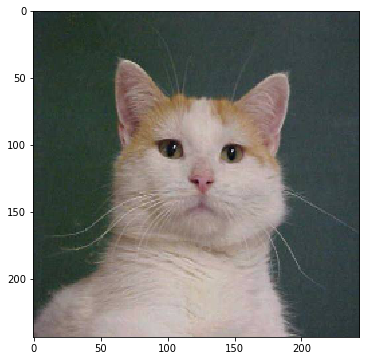

In [33]:
# Get an image to play with
image = next(valid)[0][0:1]
plots(image)

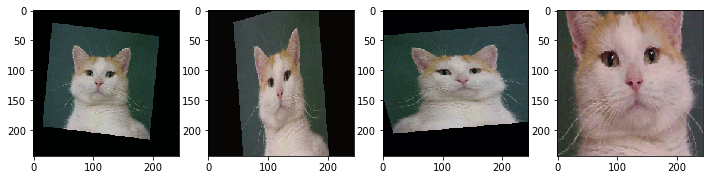

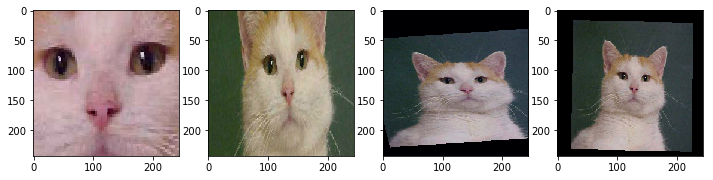

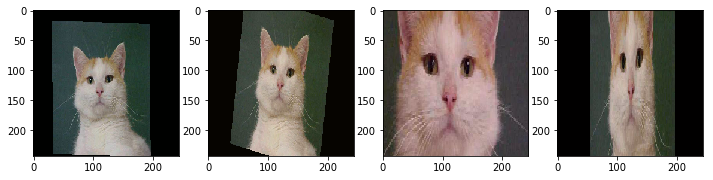

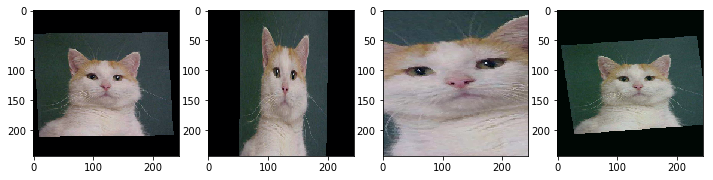

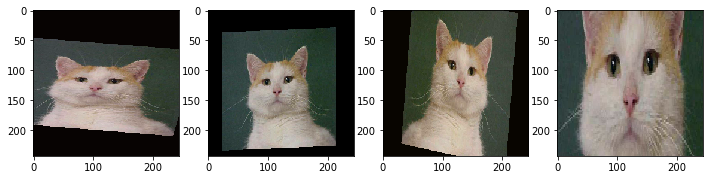

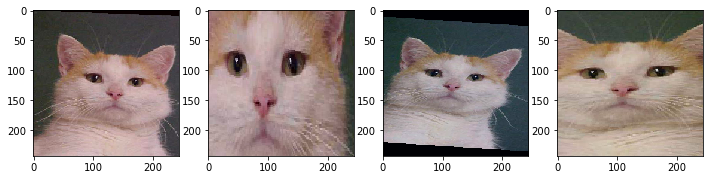

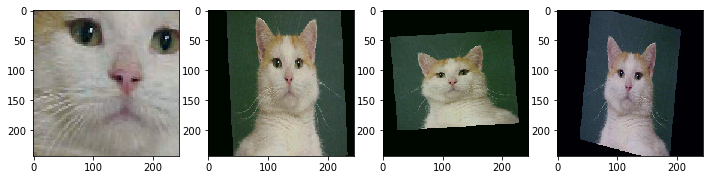

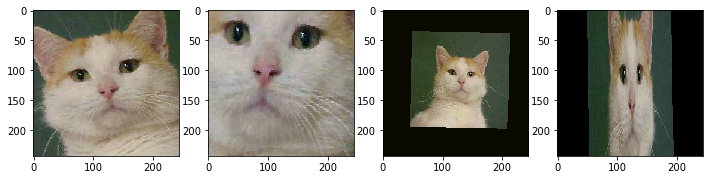

In [35]:
# try augumentation on this image
data_generator = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.75,
    channel_shift_range=10,
    shear_range=0.05,
    horizontal_flip=True,
    fill_mode='constant'
)
images_generator = data_generator.flow(image)
augumented_images = [next(images_generator)[0] for i in range(32)]
plot_images(augumented_images, images_per_row=4)

## Define VGG model.

In [47]:
model = vgg16_model()

/home/ubuntu/anaconda2/lib/python2.7/site-packages/keras/layers/core.py:622: UserWarning: `output_shape` argument not specified for layer lambda_2 and cannot be automatically inferred with the Theano backend. Defaulting to output shape `(None, 3, 224, 224)` (same as input shape). If the expected output shape is different, specify it via the `output_shape` argument.
  .format(self.name, input_shape))


In [ ]:
# get_weight_layers(weights_file)

In [8]:
# Load the Imagenet precomputed weights
model = vgg_load_weights(model, weights_file=weights_file)

Finally, compile and the model is ready to use.

In [9]:
model = model_compile(model)
model_name = get_name_and_save_model(model)

In [8]:
# Read the mappings from class id to class name
mappings = setup_imagenet_id_to_class()

Predict some images

In [ ]:
batch = train.next()
images = batch[0][0:5]
predictions = model.predict(images)
predictions_class_ids = np.argmax(predictions, axis=1)
predicted_classes = [imagenet_id_to_class(id) for id in predictions_class_ids]
plots(images, titles=predicted_classes)

## Finetune last layer(s) using full network

Pop the 1000 classes last layer off our model, and replace it with a 2 class (dog, cat).

In [10]:
model = vgg_finetune(model)

In [11]:
model = model_compile(model, optimizer=Adam())  # Adadelta, RMSprop
model_name = get_name_and_save_model(model)

In [ ]:
checkpoint = get_checkpoint(model_name, period=1)

Finetune the new output layer.

In [ ]:
# Use a part of the train set for an epoch. Otherwise keras/theano
# mysteriously hangs when training is complete
train_per_epoch = 0.5
samples_per_epoch = int(
    ((train.nb_sample * train_per_epoch) // batch_size) * batch_size)
model.fit_generator(train, samples_per_epoch=samples_per_epoch,
                    nb_epoch=int(1 / train_per_epoch),
                    validation_data=valid, nb_val_samples=valid.nb_sample,
                    callbacks=[checkpoint])

In [ ]:
model.optimizer.lr = 1e-4
# Use only a part of the train set for an epoch. Otherwise keras/theano
# mysteriously hangs when training is complete
train_per_epoch = 0.5
samples_per_epoch = int(
    ((train.nb_sample * train_per_epoch) // batch_size) * batch_size)
model.fit_generator(train, samples_per_epoch=samples_per_epoch,
                    nb_epoch=int(1 / train_per_epoch),
                    validation_data=valid, nb_val_samples=valid.nb_sample,
                    callbacks=[checkpoint])

In [ ]:
model.optimizer.lr = 1e-6
# Use only a part of the train set for an epoch. Otherwise keras/theano
# mysteriously hangs when training is complete
train_per_epoch = 0.5
samples_per_epoch = int(
    ((train.nb_sample * train_per_epoch) // batch_size) * batch_size)
model.fit_generator(train, samples_per_epoch=samples_per_epoch,
                    nb_epoch=int(1 / train_per_epoch),
                    validation_data=valid, nb_val_samples=valid.nb_sample,
                    callbacks=[checkpoint])

In [ ]:
model.optimizer.lr = 1e-7
# Use only a part of the train set for an epoch. Otherwise keras/theano
# mysteriously hangs when training is complete
model.fit_generator(train, samples_per_epoch=train.nb_sample,
                    nb_epoch=1,
                    validation_data=valid, nb_val_samples=valid.nb_sample,
                    callbacks=[checkpoint])

In [ ]:
model.save(model_name + '/vgg16_3x4096_noAug_Drop0.5_BN')

## TODO: Find best data augmentation

In [29]:
batch_size = 64
shuffle = True
train_path = os.path.join(path, 'train')

model = vgg16_model()
model = vgg_finetune(model)
model = model_compile(model, optimizer=Adam())
_, flatten_index = get_last_layer(model, Flatten)
for index in range(flatten_index, len(model.layers)):
    model.layers[index].trainable = True

/home/ubuntu/anaconda2/lib/python2.7/site-packages/keras/layers/core.py:622: UserWarning: `output_shape` argument not specified for layer lambda_3 and cannot be automatically inferred with the Theano backend. Defaulting to output shape `(None, 3, 224, 224)` (same as input shape). If the expected output shape is different, specify it via the `output_shape` argument.
  .format(self.name, input_shape))


In [ ]:
[layer.trainable for layer in model.layers]

In [ ]:
data_generator = ImageDataGenerator(
    rotation_range=10,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.75,
    channel_shift_range=10,
    shear_range=0.05,
    horizontal_flip=True,
    fill_mode='constant'
)
train_generator = data_generator.flow_from_directory(directory=train_path,
                                                     batch_size=batch_size,
                                                     target_size=image_size,
                                                     shuffle=shuffle,
                                                     class_mode='categorical')

weights_file = ('2xC64-2xC128-3xC256-6xC512-3xD4096-Drop0.5-BN/'
                + '23.2-17.9.34-00-0.0398.hdf5')
model.load_weights(weights_file)
# Use only part of the train set for an epoch.
train_per_epoch = 0.2
samples_per_epoch = int(
    ((train.nb_sample * train_per_epoch) // batch_size) * batch_size)
model.fit_generator(train_generator, samples_per_epoch=samples_per_epoch,
                    nb_epoch=int(1 / train_per_epoch),
                    validation_data=valid,
                    nb_val_samples=valid.nb_sample)

## Extract features (embeddings) 

### Setup extract features model

##### Resnet50

In [4]:
%xdel features_extract_model
for i in range(3):
    gc.collect()

inp = Input(shape=((3, ) + image_size))
lambda_layer = Lambda(preprocess)(inp)

features_extract_model = ResNet50(include_top=False, input_tensor=lambda_layer)

# Get rid of the classification layer softmax
features_extract_model.layers.pop()
features_extract_model.outputs = [features_extract_model.layers[-1].output]
# added this line in addition to zo7 solution
features_extract_model.output_layers = [features_extract_model.layers[-1]]
features_extract_model.layers[-1].outbound_nodes = []

NameError: name 'features_extract_model' is not defined


/home/ubuntu/anaconda2/lib/python2.7/site-packages/keras/layers/core.py:622: UserWarning: `output_shape` argument not specified for layer lambda_1 and cannot be automatically inferred with the Theano backend. Defaulting to output shape `(None, 3, 400, 400)` (same as input shape). If the expected output shape is different, specify it via the `output_shape` argument.
  .format(self.name, input_shape))


In [ ]:
features_extract_model.summary()

##### VGG16

In [14]:
# Review the model to pick a layer to extract features
model = vgg16_model()
weights_file = 'vgg16_bn.h5'
model = vgg_load_weights(model, weights_file)
model_compile(model)
model.summary()

/home/ubuntu/anaconda2/lib/python2.7/site-packages/keras/layers/core.py:622: UserWarning: `output_shape` argument not specified for layer lambda_1 and cannot be automatically inferred with the Theano backend. Defaulting to output shape `(None, 3, 224, 224)` (same as input shape). If the expected output shape is different, specify it via the `output_shape` argument.
  .format(self.name, input_shape))


____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_1 (Lambda)                (None, 3, 224, 224)   0           lambda_input_1[0][0]             
____________________________________________________________________________________________________
zeropadding2d_2 (ZeroPadding2D)  (None, 3, 226, 226)   0           lambda_1[0][0]                   
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 64, 224, 224)  1792        zeropadding2d_2[0][0]            
____________________________________________________________________________________________________
zeropadding2d_3 (ZeroPadding2D)  (None, 64, 226, 226)  0           convolution2d_1[0][0]            
___________________________________________________________________________________________

Use the last max pool layer.

In [15]:
features_layer, features_layer_index = get_last_layer(model, Flatten)
# features_layer = model.get_layer(name="flatten_1")
features_layer.name, features_layer_index

('flatten_1', 32)

In [16]:
# Model to extract the features
features_extract_model = Model(input=model.input,
                               output=features_layer.output)

### Compute features/embeddings

In [27]:
batch_size = 64

In [5]:
# Get train, valid and test data
train = get_batch(os.path.join(path, 'train/'),
                  batch_size=batch_size,
                  augument=False,
                  shuffle=False,
                  )
train_labels = to_categorical(train.classes, nb_classes=train.nb_class)
train_filenames = train.filenames
valid = get_batch(os.path.join(path, 'valid/'),
                  batch_size=batch_size,
                  augument=False,
                  shuffle=False
                  )
valid_labels = to_categorical(valid.classes, nb_classes=valid.nb_class)
valid_filenames = valid.filenames
test = get_batch(os.path.join(path, 'test/'),
                 batch_size=batch_size,
                 augument=False,
                 shuffle=False,
                 class_mode=None)
test_filenames = test.filenames

Found 22964 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 12500 images belonging to 1 classes.


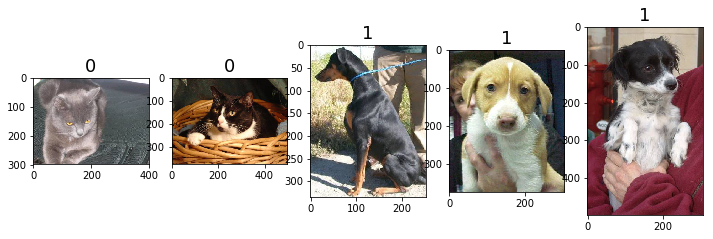

In [16]:
# Sanity check some labels
start = 998
end = 1003
files = [os.path.join(path, 'valid/', filename)
         for filename in valid.filenames[start:end]]
plot_files(files, titles=valid.classes[start:end])

#### Validation set features

In [ ]:
# Extract the valid features
valid_features = features_extract_model.predict_generator(
    valid, val_samples=valid.nb_sample)
save_array('valid_features_resnet50_large.bc', valid_features)
save_array('valid_labels.bc', valid_labels)
save_array('valid_filenames.bc', valid_filenames)

#### Train set features

In [6]:
# Extract the train features
repeat_train_set_n = 1
filename_postfix = 'resnet50_light_aug_large'
train_features = features_extract_model.predict_generator(
    train, val_samples=train.nb_sample * repeat_train_set_n)
# Save the computed features
features_filename = 'train_features_{}x_{}.bc'.format(repeat_train_set_n,
                                                      filename_postfix)
save_array(features_filename, train_features)
# Save the labels and the filenames for the computed features
labels_filename = 'train_labels_{}x_clean.bc'.format(repeat_train_set_n,
                                                     filename_postfix)
names_filename = 'train_filenames_{}x_clean.bc'.format(repeat_train_set_n,
                                                       filename_postfix)

if repeat_train_set_n == 1:
    save_array(labels_filename, train_labels)
    save_array(names_filename, train_filenames)
else:
   # Also need to repeat the train labels and filenames set
    labels_extended = np.asarray(list(train_labels) * repeat_train_set_n)
    filenames_extended = np.asarray(list(train_filenames) * repeat_train_set_n)
    save_array(labels_filename, labels_extended)
    save_array(names_filename, filenames_extended)

#### Test set features

In [ ]:
# Extract the test features
test_features = features_extract_model.predict_generator(
    test, val_samples=test.nb_sample)
save_array('test_features_resnet50_large.bc', test_features)
save_array('test_filenames.bc', test_filenames)

### Load precomputed data

In [86]:
# Load train features (if we didnt just compute them)
# train_features = load_array('train_features_1x_resnet50_light_aug.bc')
# train_labels = load_array('train_labels_1x_clean.bc')
# train_filenames = load_array('train_filenames_1x_clean.bc')

train_features = load_array('train_features_1x_no_aug.bc')
train_labels = load_array('train_labels_1x.bc')
train_filenames = load_array('train_filenames_1x.bc')

train_features.shape, train_labels.shape, train_filenames.shape

((23000, 25088), (23000, 2), (23000,))

In [6]:
# Load valid features (if we didnt just compute them)
valid_features = load_array('valid_features_vgg16.bc')
valid_labels = load_array('valid_labels.bc')
valid_filenames = load_array('valid_filenames.bc')
valid_features.shape, valid_labels.shape, valid_filenames.shape

((2000, 25088), (2000, 2), (2000,))

In [106]:
# Load test features (if we didnt just compute them)
test_features = load_array('test_features_vgg16.bc')
test_filenames = load_array('test_filenames.bc')
test_features.shape, test_filenames.shape

((12500, 25088), (12500,))

##### Clean up precomputed data from bad labels

In [54]:
def get_bad_indexes_to_delete(filenames, bad_filenames):
    delete_indexes = []
    for index, filename in enumerate(filenames):
        # Remove the folder and file extension
        name = re.sub('^(cat/|dog/)', '', filename)
        name = re.sub('.jpg', '', name)

        if name in bad_filenames:
            # This is a bad record. Keep its index to remove it later.
            delete_indexes.append(index)

    return delete_indexes

# Load the bad labels file
bad_data = np.genfromtxt('relabel.csv', delimiter=',', dtype=str)
# Get the filenames only: first column, after header
bad_filenames = bad_data[1:, 0]

In [58]:
delete_indexes = get_bad_indexes_to_delete(train_filenames, bad_filenames)

train_filenames = np.delete(train_filenames, delete_indexes, axis=0)
train_features = np.delete(train_features, delete_indexes, axis=0)
train_labels = np.delete(train_labels, delete_indexes, axis=0)

train_features.shape, train_labels.shape, train_filenames.shape

((114820, 2048, 1, 1), (114850, 2), (114850,))

In [55]:
delete_indexes = get_bad_indexes_to_delete(valid_filenames, bad_filenames)
delete_indexes
valid_filenames = np.delete(valid_filenames, delete_indexes, axis=0)
valid_features = np.delete(valid_features, delete_indexes, axis=0)
valid_labels = np.delete(valid_labels, delete_indexes, axis=0)

valid_features.shape, valid_labels.shape, valid_filenames.shape

((1996, 2048, 1, 1), (1996, 2), (1996,))

## Test time augmentation

In [41]:
# Review the model to pick a layer to extract features
model_vgg = vgg16_model()
weights_file = 'vgg16_bn.h5'
model_vgg = vgg_load_weights(model_vgg, weights_file)
model_compile(model_vgg)
features_layer, features_layer_index = get_last_layer(model_vgg, Flatten)
# Model to extract the features
features_extract_model = Model(input=model_vgg.input,
                               output=features_layer.output)

/home/ubuntu/anaconda2/lib/python2.7/site-packages/keras/layers/core.py:622: UserWarning: `output_shape` argument not specified for layer lambda_1 and cannot be automatically inferred with the Theano backend. Defaulting to output shape `(None, 3, 224, 224)` (same as input shape). If the expected output shape is different, specify it via the `output_shape` argument.
  .format(self.name, input_shape))


In [100]:
features_extract_model.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
lambda_input_1 (InputLayer)      (None, 3, 224, 224)   0                                            
____________________________________________________________________________________________________
lambda_1 (Lambda)                (None, 3, 224, 224)   0           lambda_input_1[0][0]             
____________________________________________________________________________________________________
zeropadding2d_1 (ZeroPadding2D)  (None, 3, 226, 226)   0           lambda_1[0][0]                   
____________________________________________________________________________________________________
convolution2d_1 (Convolution2D)  (None, 64, 224, 224)  1792        zeropadding2d_1[0][0]            
___________________________________________________________________________________________

In [42]:
# Load the model
model_dir = '3xD4096-Drop0.1/'
model_def = '3xD4096-Drop0.1.json'
with open(model_dir + model_def) as f:
    model_fast = model_from_json(f.read())

weights_file = '0.0377.hdf5'
model_fast.load_weights(model_dir + weights_file)
# Make sure the weights are correct
categorical_crossentropy(valid_labels, model.predict(valid_features)).eval()

array(0.03933695809565295)

In [88]:
# 10 test time augmentations
all_predictions = []
for augmentation_index in range(10):
    valid = get_batch(os.path.join(path, 'valid/'),
                      batch_size=batch_size,
                      augument=True,
                      shuffle=False)
    embeddings = features_extract_model.predict_generator(
        valid,
        val_samples=valid.nb_sample)
    predictions = model_fast.predict(embeddings)
    all_predictions.append(predictions)

Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


In [91]:
# preds =  np.squeeze(np.array(all_predictions))
preds = np.mean(np.array(all_predictions), axis=0)
preds.shape

(2000, 2)

In [92]:
# Make sure the weights are correct
categorical_crossentropy(valid_labels, preds).eval()
# categorical_crossentropy(valid_labels, preds).eval()

array(0.038737076348788764)

It is unclear whether the result is better. But probably helps with overfitting.


## Pseudo Labeling

In [8]:
%xdel model
for i in range(3):
    gc.collect()
# Load the model
model_dir = '3xD4096-Drop0.1/'
model_def = '3xD4096-Drop0.1.json'
with open(model_dir + model_def) as f:
    model = model_from_json(f.read())

weights_file = '0.0377.hdf5'
model.load_weights(model_dir + weights_file)
model.compile(
    optimizer=Adam(lr=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy'])

# Make sure the weights are correct
categorical_crossentropy(valid_labels, model.predict(valid_features)).eval()

NameError: name 'model' is not defined


array(0.03933695809565295)

In [9]:
model.load_weights(model_dir + weights_file)
categorical_crossentropy(valid_labels, model.predict(valid_features)).eval()

array(0.03933695809565295)

In [10]:
pseudo_labels = model.predict(test_features)

In [11]:
%xdel model
for i in range(3):
    gc.collect()

In [99]:
all_features = np.concatenate(
    [train_features, test_features, valid_features], axis=0)

In [100]:
all_labels = np.concatenate(
    [train_labels, pseudo_labels, valid_labels], axis=0)

In [101]:
model.fit(all_features, all_labels,
          batch_size=128,
          nb_epoch=1,
          validation_data=(valid_features, valid_labels),
          shuffle=True)

Train on 37500 samples, validate on 2000 samples
Epoch 1/1
37500/37500 [==============================] - 39s - loss: 0.0065 - acc: 0.9995 - val_loss: 3.5766e-04 - val_acc: 1.0000

In [10]:
# Only keep pretty certain pseudo labels
probabilities = pseudo_labels[:, 1]
certain_indexes = np.where(
    np.logical_or(probabilities >= 0.6, probabilities <= 0.4)
)[0]
certain_predictions = probabilities[certain_indexes]
pseudo_labels = to_categorical(np.round(certain_predictions))

# pseudo_labels = to_categorical(np.round(predict_results[:,1]))
# pseudo_labels = predict_results
# pseudo_labels = np.round(predict_results)

pseudo_features = test_features[certain_indexes]
pseudo_filenames = test_filenames[certain_indexes]

In [14]:
batch_size = 128
train_filepaths = [os.path.join('train', filename)
                   for filename in train_filenames]
pseudo_filepaths = [os.path.join('test', filename)
                    for filename in pseudo_filenames]

train_random_indexes = np.random.permutation(train_features.shape[0])
train_batch = zip(train_features[train_random_indexes],
                  train_labels[train_random_indexes])

pseudo_random_indexes = np.random.permutation(pseudo_features.shape[0])
pseudo_batch = zip(pseudo_features[pseudo_random_indexes],
                   pseudo_labels[pseudo_random_indexes])

train_and_pseudo_nb_samples = train_features.shape[
    0] + pseudo_features.shape[0]

train_and_pseudo_generator = combine_input_generator(
    [train_batch, pseudo_batch],
    batch_sizes=[(batch_size * 2) // 3, batch_size // 3],
    shuffle=False)

In [15]:
next(train_and_pseudo_generator)[0].shape

(127, 25088)

In [ ]:
model.fit_generator(train_and_pseudo_generator,
                    samples_per_epoch=train_and_pseudo_nb_samples,
                    nb_epoch=1,
                    validation_data=(valid_features, valid_labels),
                    nb_val_samples=len(valid_features)
                    )

In [452]:
valid_batch = zip(valid_features,
                  valid_labels)
valid_nb_samples = valid_features.shape[0]
valid_generator = combine_input_generator(
    [valid_batch],
    batch_sizes=[batch_size])

## Finetune with precomputed features

#### Setup Resnet Top Model

In [44]:
%xdel model_fast
for i in range(3):
    gc.collect()

dropout = 0.5
batch_size = 128

# # resnet = ResNet50(include_top=False, input_shape=(3, 224, 224))
# # for layer in resnet.layers:
# #     if hasattr(layer, 'trainable'):
# #         layer.trainable = False
# # top_input = resnet.output
# # inp = resnet.input

# top_input = Input(shape=(2048,13,13))
# inp = top_input

# x = BatchNormalization(axis=1)(top_input)
# x = Flatten()(x)
# x = Dropout(dropout)(x)
# x = Dense(1024, activation='relu')(x)
# x = BatchNormalization()(x)
# x = Dropout(dropout/2)(x)
# x = Dense(1024, activation='relu')(x)
# x = BatchNormalization()(x)
# x = Dropout(dropout)(x)
# x = Dense(2, activation='softmax')(x)
# model_fast = Model(inp, x)

# model_fast = Sequential([
#     Flatten(input_shape=(2048, 1, 1)),
#     Dropout(dropout),
#     Dense(1024),
#     BatchNormalization(),
#     Dropout(dropout),
#     Dense(2, activation='softmax')])

dropout = 0.01
model_fast = Sequential([
    GlobalAveragePooling2D(input_shape=(2048, 13, 13)),
    Dropout(dropout),
    #     Dense(4096, activation='relu'),
    #     BatchNormalization(),
    #     Dropout(dropout),
    #     Dense(4096, activation='relu'),
    #     BatchNormalization(),
    #     Dropout(dropout),
    Dense(2, activation='softmax')
])

# # Change Dropout amount by adjusting weights
# if dropout != previous_dropout:
#     model = change_dropout(
#         model,
#         previous_dropout=previous_dropout,
#         new_dropout=dropout)

model_fast.name = get_name_and_save_model(model_fast, prefix='resnet50_')
checkpoint = get_checkpoint(model_name=model_fast.name, period=1)
learning_rate = 1e-3
model_fast = model_compile(model_fast, learning_rate=learning_rate)

In [158]:
[(layer.trainable, layer.name)
 for layer in model_fast.layers
 if hasattr(layer, 'trainable')]

[(False, 'input_40'),
 (False, 'zeropadding2d_46'),
 (False, 'conv1'),
 (False, 'bn_conv1'),
 (False, 'activation_1569'),
 (False, 'maxpooling2d_38'),
 (False, 'res2a_branch2a'),
 (False, 'bn2a_branch2a'),
 (False, 'activation_1570'),
 (False, 'res2a_branch2b'),
 (False, 'bn2a_branch2b'),
 (False, 'activation_1571'),
 (False, 'res2a_branch2c'),
 (False, 'res2a_branch1'),
 (False, 'bn2a_branch2c'),
 (False, 'bn2a_branch1'),
 (False, 'activation_1572'),
 (False, 'res2b_branch2a'),
 (False, 'bn2b_branch2a'),
 (False, 'activation_1573'),
 (False, 'res2b_branch2b'),
 (False, 'bn2b_branch2b'),
 (False, 'activation_1574'),
 (False, 'res2b_branch2c'),
 (False, 'bn2b_branch2c'),
 (False, 'activation_1575'),
 (False, 'res2c_branch2a'),
 (False, 'bn2c_branch2a'),
 (False, 'activation_1576'),
 (False, 'res2c_branch2b'),
 (False, 'bn2c_branch2b'),
 (False, 'activation_1577'),
 (False, 'res2c_branch2c'),
 (False, 'bn2c_branch2c'),
 (False, 'activation_1578'),
 (False, 'res3a_branch2a'),
 (False, 'bn

#### Setup the VGG Top model

In [5]:
%xdel model_fast
for i in range(3):
    gc.collect()

batch_size = 128
dropout = 0.5
previous_dropout = 0.5
# weights_file = ('2xD4096-Drop0.1-BN/'
#                 + '0.0384.hdf5')
weights_file = None
model_fast, checkpoint = create_model(
    dropout=dropout,
    previous_dropout=previous_dropout,
    batch_norm=True,
    learning_rate=1e-5,
    weights_file=weights_file,
    save_period=1,
    num_dense=3)

In [ ]:
model_fast.summary()

##### Load the weights (dense only)

In [228]:
# weights_file = ('3xD4096-Drop0.5/'
#                 + '25.2-19.19.55-00-0.0415.hdf5')
# get_weight_layers(weights_file)
model_fast.load_weights(weights_file)

##### Load the weights (from the full model)

In [151]:
# weights_file = ('2xC64-2xC128-3xC256-6xC512-3xD4096-Drop0.5-BN/'
#                 + '23.2-13.50.31-00-0.0445.hdf5')
# get_weight_layers(weights_file)
# weights_file = ('2xC64-2xC128-3xC256-6xC512-2xD4096-Drop0.5-BN/'
#                 + '22.2-15.32.43-09-0.0656.hdf5')
weights_file = 'vgg16.h5'

In [156]:
# Load a VGG16 model to load weights from
model_vgg = vgg16_model(batch_norm=False)
model_vgg = vgg_load_weights(model_vgg, weights_file)

/home/ubuntu/anaconda2/lib/python2.7/site-packages/keras/layers/core.py:622: UserWarning: `output_shape` argument not specified for layer lambda_4 and cannot be automatically inferred with the Theano backend. Defaulting to output shape `(None, 3, 224, 224)` (same as input shape). If the expected output shape is different, specify it via the `output_shape` argument.
  .format(self.name, input_shape))


Get the fc layers of model_vgg

In [157]:
flatten_layer, flatten_index = get_last_layer(model_vgg, Flatten)
fc_layers = model_vgg.layers[flatten_index + 1:]

In [158]:
fc_layers

In [ ]:
for new_layer, computed_layer in zip(model_fast.layers, fc_layers):
    new_layer.set_weights(computed_layer.get_weights())

In [186]:
print([layer.trainable for layer in model_fast.layers])

[True, True, True, True, True, True, True]


#### Retrain the last layer(s)

In [45]:
model_fast.summary()

____________________________________________________________________________________________________
Layer (type)                     Output Shape          Param #     Connected to                     
globalaveragepooling2d_4 (Global (None, 2048)          0           globalaveragepooling2d_input_4[0]
____________________________________________________________________________________________________
dropout_13 (Dropout)             (None, 2048)          0           globalaveragepooling2d_4[0][0]   
____________________________________________________________________________________________________
dense_13 (Dense)                 (None, 2)             4098        dropout_13[0][0]                 
Total params: 4,098
Trainable params: 4,098
Non-trainable params: 0
____________________________________________________________________________________________________


In [46]:
model_fast.optimizer.lr = 1e-3
history = model_fast.fit(train_features, train_labels,
                         shuffle=True,
                         nb_epoch=5,
                         validation_data=(valid_features, valid_labels),
                         batch_size=batch_size,
                         callbacks=[checkpoint])
model_fast.optimizer.lr = 1e-4
history = model_fast.fit(train_features, train_labels,
                         shuffle=True,
                         nb_epoch=5,
                         validation_data=(valid_features, valid_labels),
                         batch_size=batch_size,
                         callbacks=[checkpoint])
model_fast.optimizer.lr = 1e-5
history = model_fast.fit(train_features, train_labels,
                         shuffle=True,
                         nb_epoch=10,
                         validation_data=(valid_features, valid_labels),
                         batch_size=batch_size,
                         callbacks=[checkpoint])

# train_set = train_and_pseudo_nb_samples
# batch_size = 64
# train_set = train
# train_set_samples = train.nb_sample
# valid_set = valid_generator
# valid_set_samples = valid_nb_samples
# samples_per_epoch = (train_set_samples // batch_size) * batch_size
# history = model_fast.fit_generator(train_set,
#                                   samples_per_epoch=samples_per_epoch,
#                                   nb_epoch=5,
#                                   validation_data=valid_set,
#                                   nb_val_samples=valid_set_samples,
#                                   callbacks=[checkpoint],
#                                   )

Train on 22964 samples, validate on 2000 samples
Epoch 1/5
22964/22964 [==============================] - 19s - loss: 0.0942 - acc: 0.9692 - val_loss: 0.0788 - val_acc: 0.9665

KeyboardInterrupt: 

In [ ]:
model_fast.save_weights(os.path.join(model.name, model.name))

#### Test for best dropout values

In [173]:
batch_size = 128
weights_file = ('2xD4096-Drop0.5/'1
                + '26.2-12.23.38-00-0.0466.hdf5')
# weights_file = 'VGG16-BN-Drop0.5-21.2-20.34.11-04-0.0648.hdf5'
# Try out 10 different dropout values
for i in range(10):
    dropout = 0.1 * i
    model_fast, checkpoint = create_model(dropout=dropout,
                                          learning_rate=1e-5,
                                          weights_file=weights_file,
                                          batch_norm=False,
                                          num_dense=2)
    history = model_fast.fit(train_features, train_labels,
                             shuffle=True,
                             nb_epoch=1,
                             validation_data=(valid_features, valid_labels),
                             batch_size=batch_size,
                             callbacks=[])
    model_fast.optimizer.lr = 1e-5
    history = model_fast.fit(train_features, train_labels,
                             shuffle=True,
                             nb_epoch=1,
                             validation_data=(valid_features, valid_labels),
                             batch_size=batch_size,
                             callbacks=[])
    min_loss = history.history['val_loss'][-1]
    print('Dropout: {} Log loss: {}'.format(dropout, min_loss))
    # Release the GPU memory used by model_fast
    %xdel model_fast
    for i in range(3):
        gc.collect()

# Best 2xD noBN Dropout: 0.0 or 0.1 (loss 0.075)

Train on 114780 samples, validate on 1993 samples
Epoch 1/1
114780/114780 [==============================] - 46s - loss: 0.0908 - acc: 0.9763 - val_loss: 0.0775 - val_acc: 0.9829

In [ ]:
batch_size = 128
weights_file = ('3xD4096-Drop0.5-BN/'
                + '23.2-9.39.46-00-0.0429.hdf5')
# Try out 10 different dropout values
for i in range(10):
    dropout = 0.1 * i
    model_fast, checkpoint = create_model(dropout=dropout,
                                          learning_rate=1e-5,
                                          weights_file=weights_file,
                                          batch_norm=True,
                                          num_dense=3)
    history = model_fast.fit(train_features, train_labels,
                             shuffle=True,
                             nb_epoch=2,
                             validation_data=(valid_features, valid_labels),
                             batch_size=batch_size,
                             callbacks=[])
    min_loss = history.history['val_loss'][-1]
    print('Dropout: {} Log loss: {}'.format(dropout, min_loss))
    # Release the GPU memory used by model_fast
    %xdel model_fast
    for i in range(3):
        gc.collect()

# Best 3xD BN Dropout: 0.2 (loss 0.039)

Train on 114780 samples, validate on 1993 samples
Epoch 1/2
114780/114780 [==============================] - 57s - loss: 0.0816 - acc: 0.9663 - val_loss: 0.0579 - val_acc: 0.9774

In [ ]:
batch_size = 128
weights_file = ('2xD4096-Drop0.5-BN/'
                + '25.2-22.2.3-00-0.0565.hdf5')
# Try out 10 different dropout values
for i in range(10):
    dropout = 0.1 * i
    model_fast, checkpoint = create_model(dropout=dropout,
                                          learning_rate=1e-5,
                                          weights_file=weights_file,
                                          batch_norm=True,
                                          num_dense=2)
    history = model_fast.fit(train_features, train_labels,
                             shuffle=True,
                             nb_epoch=2,
                             validation_data=(valid_features, valid_labels),
                             batch_size=batch_size,
                             callbacks=[])
    min_loss = history.history['val_loss'][-1]
    print('Dropout: {} Log loss: {}'.format(dropout, min_loss))
    # Release the GPU memory used by model_fast
    %xdel model_fast
    for i in range(3):
        gc.collect()

# Best 2xD BN Dropout: 0.1 (loss 0.040)

Train on 114780 samples, validate on 1993 samples
Epoch 1/2
114780/114780 [==============================] - 49s - loss: 0.0795 - acc: 0.9691 - val_loss: 0.0448 - val_acc: 0.9824

In [177]:
batch_size = 128
weights_file = ('3xD4096-Drop0.5/'
                + '25.2-19.19.55-00-0.0415.hdf5')
# Try out 10 different dropout values
for i in range(10):
    dropout = 0.1 * i
    model_fast, checkpoint = create_model(dropout=dropout,
                                          learning_rate=1e-5,
                                          weights_file=weights_file,
                                          batch_norm=False,
                                          num_dense=3)
    history = model_fast.fit(train_features, train_labels,
                             shuffle=True,
                             nb_epoch=2,
                             validation_data=(valid_features, valid_labels),
                             batch_size=batch_size,
                             callbacks=[])
    min_loss = history.history['val_loss'][-1]
    print('Dropout: {} Log loss: {}'.format(dropout, min_loss))
    # Release the GPU memory used by model_fast
    %xdel model_fast
    for i in range(3):
        gc.collect()

# Best 3xD noBN Dropout: 0.0 (loss 0.05) or 0.1 (loss 0.054)

Train on 114780 samples, validate on 1993 samples
Epoch 1/2
114780/114780 [==============================] - 54s - loss: 0.1154 - acc: 0.9626 - val_loss: 0.0492 - val_acc: 0.9829

## Retrain FC layers with data augmentation

#### Create the model

In [ ]:
%xdel model_full
for i in range(3):
    gc.collect()

weights_file = ('2xC64-2xC128-3xC256-6xC512-3xD4096-Drop0.5-BN/'
                + '23.2-13.50.31-00-0.0445.hdf5')
fc_weights_file = ('3xD4096-Drop0.5-BN/'
                   + '23.2-16.2.30-00-0.0493.hdf5')
# get_weight_layers(weights_file)
model_full, checkpoint = create_full_model(weights_file, fc_weights_file,
                                           save_period=1,
                                           learning_rate=1e-5)

Review the new model

In [ ]:
for layer in model_full.layers:
    print(layer.name, layer.trainable)

In [ ]:
model_full.summary()

#### Setup data augmentation

In [ ]:
batch_size = 64
train = get_batch(os.path.join(path, 'train/'), batch_size=batch_size,
                  augument=True, fill_mode='constant')
valid = get_batch(os.path.join(path, 'valid/'), batch_size=batch_size)
test = get_batch(os.path.join(path, 'test/'),
                 batch_size=batch_size,
                 shuffle=False,
                 class_mode=None)

Preview data augmentation

In [ ]:
images = next(train)[0]
images.shape
plot_images(images[:16], images_per_row=4)

#### Train the model

In [ ]:
model_full.optimizer.lr = 1e-5
samples_per_epoch = train.nb_sample
model_full.fit_generator(train, samples_per_epoch=samples_per_epoch,
                         nb_epoch=1,
                         validation_data=valid, nb_val_samples=valid.nb_sample,
                         callbacks=[checkpoint])

In [ ]:
model_full.save_weights('model_full.hdf5')

## Model bagging

#### Train ensemble models (dense only)

In [ ]:
def train_model(model):
    samples_per_epoch = train_features.shape[0]

    model.optimizer.lr = 1e-6
    model_fast.fit(train_features, train_labels,
                   shuffle=True,
                   nb_epoch=1,
                   validation_data=(valid_features, valid_labels),
                   batch_size=batch_size)

    model.optimizer.lr = 1e-7
    model_fast.fit(train_features, train_labels,
                   shuffle=True,
                   nb_epoch=1,
                   validation_data=(valid_features, valid_labels),
                   batch_size=batch_size)


for index in range(5):
    single_model, checkpoint = create_model(
        dropout=dropout,
        batch_norm=False,
        learning_rate=1e-5,
        weights_file=weights_file,
        save_period=1,
        num_dense=3)
    weights_file = ('3xD4096-Drop0.5/'
                    + '22.2-20.4.4-00-0.0412.hdf5')
    single_model.load_weights(weights_file)

    train_model(single_model)
    single_model.save_weights(
        'VGG16-Top-3x4096-noBN-Drop0.5-Ensemble-{}'.format(index))

    % xdel single_model
    for i in range(3):
        gc.collect()

#### Train ensemble models (full)

In [ ]:
def train_model(model):
    samples_per_epoch = train.nb_sample

    model.optimizer.lr = 1e-6
    model.fit_generator(train, samples_per_epoch=samples_per_epoch,
                        nb_epoch=1,
                        validation_data=valid, nb_val_samples=valid.nb_sample,
                        callbacks=[])

    model.optimizer.lr = 1e-7
    model.fit_generator(train, samples_per_epoch=samples_per_epoch,
                        nb_epoch=1,
                        validation_data=valid, nb_val_samples=valid.nb_sample,
                        callbacks=[])

for index in range(5):
    weights_file = ('2xC64-2xC128-3xC256-6xC512-3xD4096-Drop0.5-BN/'
                    + '23.2-13.50.31-00-0.0445.hdf5')
    fc_weights_file = ('3xD4096-Drop0.5-BN/'
                       + '23.2-16.2.30-00-0.0493.hdf5')
    single_model, _ = create_full_model(weights_file, fc_weights_file,
                                        learning_rate=1e-6)
    train_model(single_model)
    single_model.save_weights('VGG16-Full-Ensemble-{}'.format(index))

    %xdel single_model
    for i in range(3):
        gc.collect()

# models = [create_model(dropout=dropout,
#                            learning_rate=1e-5,
#                            weights_file=None) for i in range(5)]
# for index, model in enumerate(models):
#     print('Model {}'.format(index))
#     train_model(model)
#     model.save_weights('VGG16-Ensemble-{}-3x4096-BN-Drop0.3'.format(index))

#### Run bagging on features model

In [ ]:
def get_bagging(create_model_func):
    ''' '''
    models = []
    for index in range(5):
        model = create_model_func(index)
        _, flatten_index = get_last_layer(model, Flatten)
        if not flatten_index:
            flatten_index = -1
        fc_layers = model.layers[flatten_index + 1:]

        # For some reason creating a Sequential model with fc_layers, sets the
        # input of the model to be the vgg16 input layer, which is different size
        # from the features input we want to feed.
        # So create a new Lambda layer, which does nothing but sets the proper
        # input func.
        # Input shape is batch shape minus the batch dimension
        input_shape = fc_layers[0].input_shape[1:]

        def nothing_func(x):
            return x
        input_layer = Lambda(nothing_func, input_shape=input_shape)
        # Prepend the Lambda layer to the fc_layers
        fc_layers.insert(0, input_layer)

        # Create the new Dense model
        short_model = Sequential(fc_layers)
        # Copy the precomputed weights
        for layer1, layer2 in zip(short_model.layers, fc_layers):
            layer1.set_weights(layer2.get_weights())
        models.append(model_compile(short_model))
    return models

##### Bagging from Top 3x4096 Drop 0.5

In [ ]:
%xdel models_top_3x4096_drop05
for i in range(3):
    gc.collect()

In [ ]:
def top_3x4096_drop05(index):
    model = setup_model_features(input_shape=(25088,), dropout=0.5,
                                 batch_norm=False)
    weights_file = 'VGG16-Top-3x4096-noBN-Drop0.5-Ensemble-{}'.format(index)
    model.load_weights(weights_file)
    return model

models_top_3x4096_drop05 = get_bagging(top_3x4096_drop05)

##### Bagging from Top 3x4096 BN Drop 0.3

In [ ]:
%xdel models_top_3x4096_bn_drop03
for i in range(3):
    gc.collect()

In [ ]:
def top_3x4096_bn_drop03(index):
    model = setup_model_features(input_shape=(25088,), dropout=0.3,
                                 batch_norm=True)
    weights_file = 'VGG16-Top-3x4096-BN-Drop0.3-Ensemble-{}'.format(index)
    model.load_weights(weights_file)
    return model

models_top_3x4096_bn_drop03 = get_bagging(top_3x4096_bn_drop03)

##### Bagging from full VGG model

In [ ]:
%xdel models_vgg_full_3x4096_bn_drop05
for i in range(3):
    gc.collect()

In [ ]:
def vgg_full_3x4096_bn_drop05(index):
    model = vgg16_model()
    # Pop the last Dx1000 and add Dx4096, BN, Drop, Dx4096
    model = vgg_finetune(model)
    weights_file = 'VGG16-Full-3xD-BN-Drop0.5-Ensemble-{}'.format(index)
    model.load_weights(weights_file)
    return model

models_vgg_full_3x4096_bn_drop05 = get_bagging(vgg_full_3x4096_bn_drop05)

In [ ]:
weights_file = 'VGG16-Top-3x4096-BN-Drop0.3-Ensemble-0'
get_weight_layers(weights_file)

##### Compute Loss

In [ ]:
models = models_top_3x4096_drop05
all_predictions = [model.predict(valid_features, batch_size=batch_size)
                   for model in models]
all_predictions_array = np.asarray(all_predictions)
test_predictions = np.mean(all_predictions, axis=0)
categorical_crossentropy(valid_labels, test_predictions).eval()

## Ensemble

### Create 

In [ ]:
models = [
'2xC64-2xC128-3xC256-6xC512-2xD4096-Drop0.5-BN',
'2xD4096-Drop0.1-BN',
'2xD4096-Drop0.3-BN',
'2xD4096-Drop0.5',
'2xD4096-Drop0.5-BN',
'3xD4096-Drop0.0',
'3xD4096-Drop0.1',
'3xD4096-Drop0.1-BN',
'3xD4096-Drop0.5',
'3xD4096-Drop0.5-BN',
'resnet50_1xD2048-1xD1024-Drop0.2-BN',
'resnet50_1xD2048-1xD1024-Drop0.5-BN',
]

all_train_predictions = []
all_test_predictions = []
i = 0
for model_name in models:
    # Load the model
    model_dir = model_name
    model_def = model_name + '.json'
    with open(os.path.join(model_dir, model_def)) as f:
        model = model_from_json(f.read())
    print(model_name, model.input_shape)

    # Find weighs file
    weights_file = glob.glob(model_dir + '/' + '*.hdf5')[0]
    model.load_weights(path + weights_file)
    model.compile(
        optimizer=Adam(lr=1e-6),
        loss='categorical_crossentropy',
        metrics=['accuracy'])

    model.name = get_name_and_save_model(model, prefix='final_')
    checkpoint = get_checkpoint(model_name=model.name, period=1)
    
    # Which data format does the model have?
    if model.input_shape == (None, 3, 224, 224):
        test_predictions = model.predict_generator(
            test, 
            val_samples=test.nb_sample)
        save_array('ensemble_test_{}.bc'.format(i), np.array(test_predictions))    
        all_test_predictions.append(test_predictions)
        
        train_predictions = model.predict_generator(
            train, 
            val_samples=train.nb_sample)
        save_array('ensemble_train_{}.bc'.format(i), np.array(train_predictions))    
        all_train_predictions.append(train_predictions)
        
    elif model.input_shape == (None, 25088):
            # Make sure the weights are correct
        print(categorical_crossentropy(
            valid_labels, model.predict(valid_features)).eval())
    
        batch = np.concatenate(
            [train_features, test_features, test_features,
            valid_features, valid_features, valid_features, valid_features,
            valid_features], 
            axis=0)
        labels = np.concatenate(
            [train_labels, pseudo_labels, pseudo_labels,
            valid_labels, valid_labels, valid_labels, valid_labels,
            valid_labels], 
            axis=0)

        model.fit(batch, labels,
          batch_size = 128,
          nb_epoch = 1,
          validation_data = (valid_features, valid_labels),
          shuffle = True,
          callbacks=[checkpoint])
    
        model.optimizer.lr = 1e-7
        model.fit(batch, labels,
          batch_size = 128,
          nb_epoch = 1,
          validation_data = (valid_features, valid_labels),
          shuffle = True,
          callbacks=[checkpoint])
        
        test_predictions = model.predict(test_features)              
        save_array('ensemble_test_{}.bc'.format(i), np.array(test_predictions))    
        all_test_predictions.append(test_predictions)
        
        train_predictions = model.predict(train_features_single)              
        save_array('ensemble_train_{}.bc'.format(i), np.array(train_predictions))    
        all_train_predictions.append(train_predictions)
        
    i += 1
    # Cleanup
    del model
    for ind in range(3):
        gc.collect()

save_array('ensemble_test.bc', np.array(all_test_predictions))
save_array('ensemble_train.bc', np.array(all_train_predictions))

### Compute Ensemble Weights

In [119]:
# Load computed train data
train_ensemble = []
for i in range(1, 12):
    ensemble_member = load_array('ensemble_train_{}.bc'.format(i))
    if i == 10 or i == 11:
        ensemble_member = ensemble_member[2000:]
    train_ensemble.append(ensemble_member[:, 1])
train_ensemble_formatted = np.array(train_ensemble).T
train_ensemble_formatted.shape

(23000, 11)

In [122]:
ensemble_model = Sequential([
    Dense(8, activation='relu', input_shape=(11,), W_regularizer=l2()),
#     Dense(32, activation='relu'),
    Dense(2, activation='softmax')
])
ensemble_model.compile(optimizer=Adam(), loss='categorical_crossentropy')

In [123]:
ensemble_model.fit(train_ensemble_formatted, train_labels, 
                   batch_size=64, 
                   nb_epoch=5, 
                   validation_split=0.2)

Train on 18400 samples, validate on 4600 samples
Epoch 1/5
18400/18400 [==============================] - 0s - loss: 0.3931 - val_loss: 0.1101
Epoch 2/5
18400/18400 [==============================] - 0s - loss: 0.1034 - val_loss: 0.0605

### Predict Test set

In [124]:
# Load computed test data
test_ensemble = []
for i in range(1, 12):
    ensemble_member = load_array('ensemble_test_{}.bc'.format(i))
    test_ensemble.append(ensemble_member[:,1])
test_ensemble_formatted = np.array(test_ensemble).T
test_ensemble_formatted.shape


(12500, 11)

In [132]:
test_predictions = ensemble_model.predict(test_ensemble_formatted)

## Review Results

##### Validation set

In [645]:
# # Get validation predictions
# valid = get_batch(os.path.join(path, 'valid/'),
#                   batch_size=batch_size * 2,
#                   shuffle=False,
#                   class_mode=None)
# val_results = model.predict_generator(valid, valid.nb_sample)
predict_features = np.tile(valid_features, (6, 1))
# predict_features = valid_features
val_results = model_fast.predict(predict_features, batch_size=1024)

In [653]:
# cat_prob = val_results[:,0]
probabilities = val_results[:, 1]
filenames = np.array([os.path.join(path, 'valid', filename)
                      for filename in valid_filenames])
names_only = valid_filenames
classes = valid_labels

names_only = np.tile(names_only, (6,))
classes = np.tile(classes, (6, 1))
filenames = np.tile(filenames, (6,))

# results = np.stack([probabilities,
#                     filenames,
#                     classes])
# How many images can we display at once
max_images = 4

In [667]:
# Trim the predictions, so that we are not penalized for confident mistakes
clip_to = 0.001
predictions_trim = np.clip(val_results, clip_to, 1 - clip_to)
categorical_crossentropy(classes,
                         predictions_trim).eval()

array(0.04142803737872937)

##### Test set

In [127]:
val_results = predictions
# val_results = model_fast.predict(test_features, batch_size=batch_size)
probabilities = val_results[:, 1]
filenames = np.array([os.path.join(path, 'test', filename)
                      for filename in test_filenames])
names_only = test_filenames
# results = np.stack([probabilities,
#                     filenames,
#                     classes])
# How many images can we display at once
max_images = 4

#### Histogram of probabilities

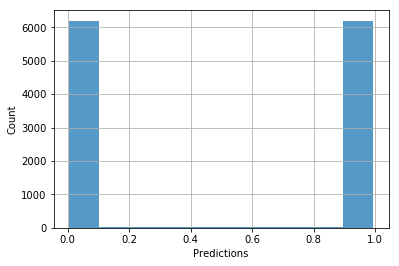

In [128]:
plt.xlabel('Predictions')
plt.ylabel('Count')
plt.hist(probabilities, 10, alpha=0.75)
plt.grid(True)
plt.show()

#### Correct labels at random

In [129]:
corrects = np.where(np.round(probabilities) == classes)[0]
random_correct_indexes = np.random.permutation(corrects)[0:max_images]
plot_files(filenames[random_correct_indexes],
           titles=probabilities[random_correct_indexes])

NameError: name 'classes' is not defined

#### Incorrect labels at random

In [ ]:
# Since they are a small amount we will display them all
incorrects = np.where(np.round(probabilities) != classes)[0]
# random_incorrect_indexes = np.random.permutation(incorrects)[0:max_images]
# display all image in the incorrect index, max_images at a time
plot_files(filenames[incorrects],
           titles=probabilities[incorrects],
           images_per_row=max_images)


#### The most correct labels of each class (high prob and correct)


##### Correct cats

In [ ]:
correct_cat_ids = np.where(
    (np.round(probabilities) == 0))[0]
# Indexes to sort correct)cat_ids
sort_indexes = np.argsort(probabilities[correct_cat_ids])
# Sorted correct
most_correct_cats = correct_cat_ids[sort_indexes]
# Get only a few samples
most_correct_cats = most_correct_cats[0:(max_images * 2)]
plot_files(filenames[most_correct_cats],
           images_per_row=max_images,
           titles=probabilities[most_correct_cats])

##### Correct dogs

In [ ]:
# Get correct dog predictions
correct_dog_ids = np.where(np.round(probabilities) == 1)[0]
# Get ids to sort correct dogs
sort_ids = np.argsort(probabilities[correct_dog_ids])
# Reverse the sort so we get the most correct
sort_ids = sort_ids[::-1]
# Sort correct dog ids
most_correct_dogs = correct_dog_ids[sort_ids]
# Get only the most correct ones
most_correct_dogs = most_correct_dogs[0:max_images * 2]
plot_files(filenames[most_correct_dogs], titles=probabilities[
           most_correct_dogs], images_per_row=max_images)

#### The most incorrect labels of each class (high prob, but incorrect)


##### Incorrect dogs

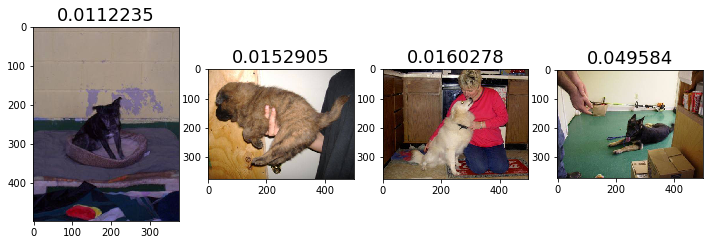

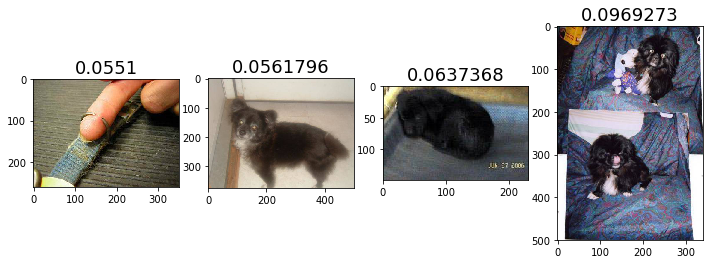

In [238]:
# Get indexes where both class is dog and we were off
incorrect_dogs = np.where(
    (classes == 1) & (np.round(probabilities) != classes))[0]
# Returns the indexes that would sort the array
sort_indexes = np.argsort(probabilities[incorrect_dogs])
# Apply the sort indexes to the incorrect dogs indexes
sorted_incorrect_dogs = incorrect_dogs[sort_indexes]
# Select only the most incorrect dogs
sorted_incorrect_dogs = sorted_incorrect_dogs[:max_images * 2]
plot_files(filenames[sorted_incorrect_dogs],
           titles=probabilities[sorted_incorrect_dogs],
           images_per_row=max_images)

##### Incorrect cats

In [ ]:
# Get indexes where both class is cat and we were off
incorrect_cats = np.where(
    (classes == 0) & (np.round(probabilities) != classes))[0]
# Get the indexes that would sort the probabilities array
sort_indexes = np.argsort(probabilities[incorrect_cats])
# Reverse sort indexes, because we want low probabilities, not high
sort_indexes = sort_indexes[::-1]
# Use the sort indexes to sort the incorrect cat indexes
incorrect_cats_sorted = incorrect_cats[sort_indexes]
# Use only the most incorrect cats
incorrect_cats_sorted = incorrect_cats_sorted[:max_images * 2]
plot_files(filenames[incorrect_cats_sorted],
           titles=probabilities[incorrect_cats_sorted],
           images_per_row=max_images)

#### The most uncertian labels (probability close to 0.5)

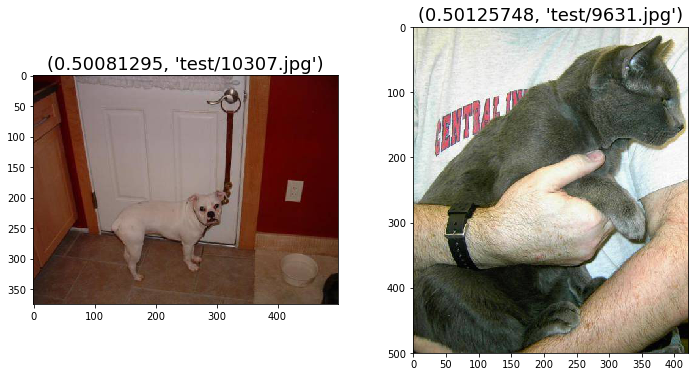

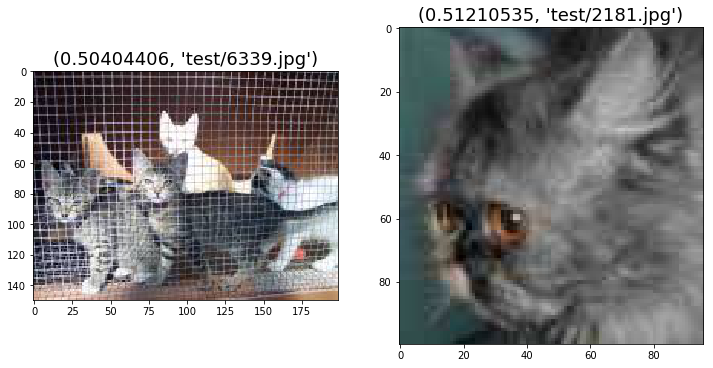

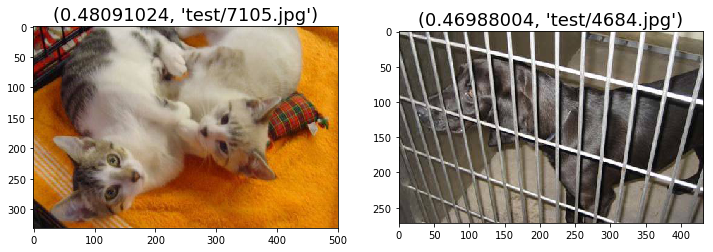

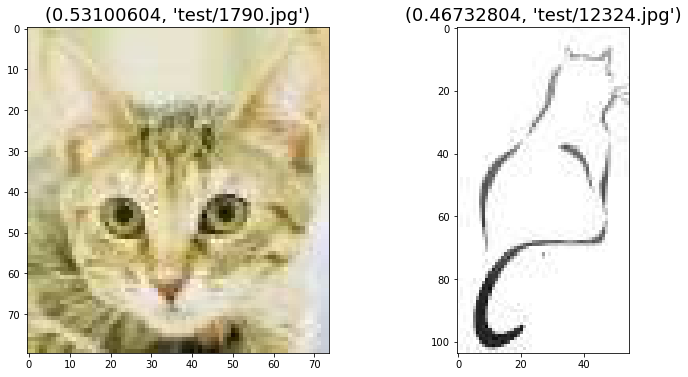

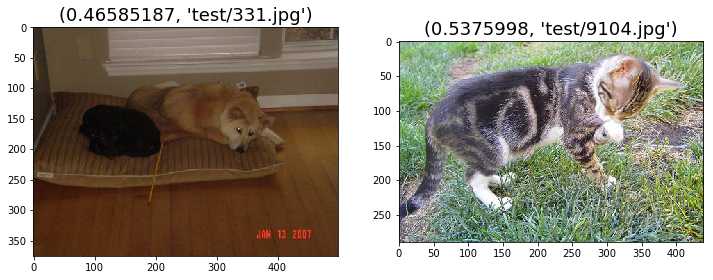

...

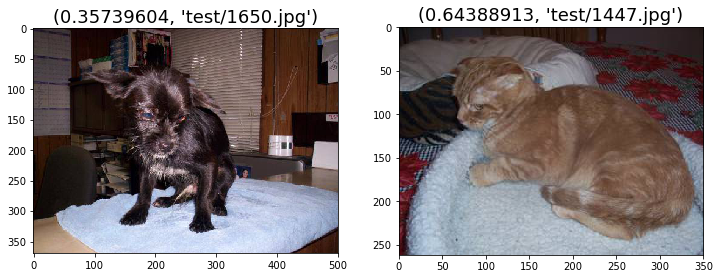

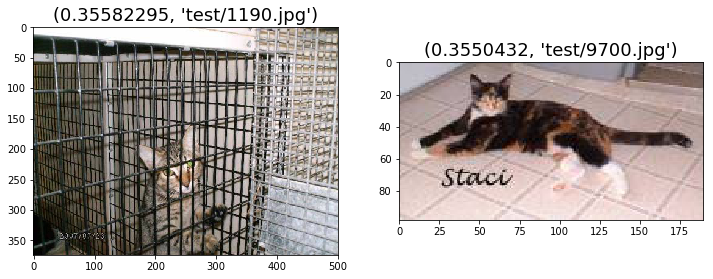

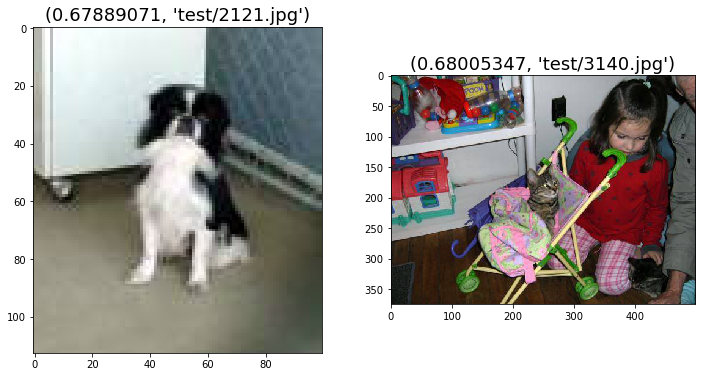

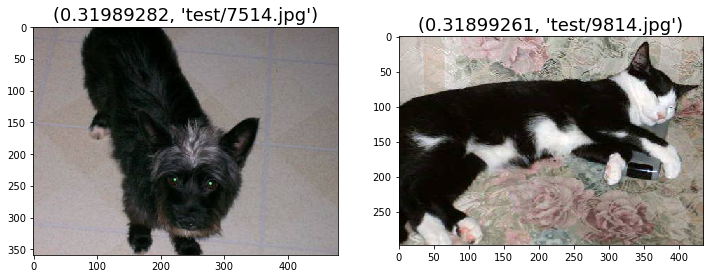

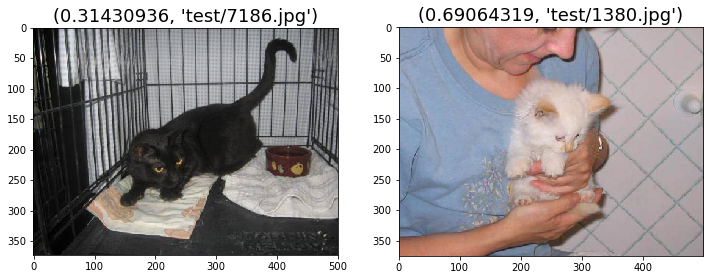

In [130]:
# Get distance to 0.5 (most uncertain)
most_uncertain = np.abs(probabilities - 0.5)
# Sort by distance to 0.5 (most uncertain)
sort_indexes = np.argsort(most_uncertain)
# Get only the most uncertain
sort_indexes = sort_indexes[:max_images * 10]
plot_files(filenames[sort_indexes],
           titles=zip(probabilities[sort_indexes], names_only[sort_indexes]),
           images_per_row=2)

## Submit results

#### Prepare predictions for test set


##### Ensemble predictions

In [ ]:
# TRY RELOADING THE TEST FEATURES BEFORE EACH PREDICT
models = models_top_3x4096_drop05
all_predictions = [model.predict(test_features, batch_size=batch_size)
                   for model in models]
all_predictions_array = np.asarray(all_predictions)
test_predictions = np.mean(all_predictions, axis=0)

##### Single model predictions

In [102]:
# test_predictions = model.predict_generator(test, val_samples=test.nb_sample)
test_predictions = model.predict(test_features, batch_size=batch_size)

##### Prep the predictions

In [131]:
# get path to test files
test_filepaths = test_filenames


def filter_test_filepath(filepath):
    '''Utility func to transform 'test/1032.jpg' to 1032
    '''
    filepath = remove_chars_re(filepath, 'test/')
    return int(remove_chars_re(filepath, '.jpg'))
# Format test files as ids
test_ids = [filter_test_filepath(filepath)
            for filepath in test_filepaths]

In [133]:
# Get dog predictions only
dog_predictions = test_predictions[:, 1]

In [141]:
# Trim the predictions, so that we are not penalized for confident mistakes
clip_to = 0.01  # 0.04
predictions_trim = np.clip(dog_predictions, clip_to, 1 - clip_to)

In [142]:
predictions = np.stack([test_ids, predictions_trim], axis=1)

In [143]:
predictions[1:10, 1]

array([ 0.99  ,  0.9899,  0.9899,  0.01  ,  0.01  ,  0.99  ,  0.01  ,  0.99  ,  0.01  ])

#### Sanity check the results


In [144]:
# test = get_batch(os.path.join(path, 'test/'),
#                  batch_size=batch_size,
#                  shuffle=False,
#                  class_mode=None)
# test_batch = test.next()
start = 0

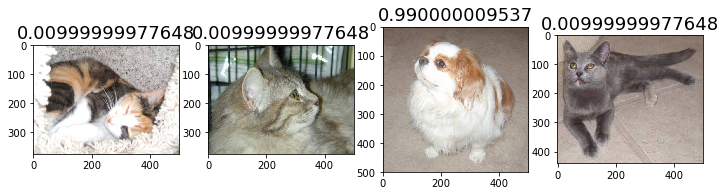

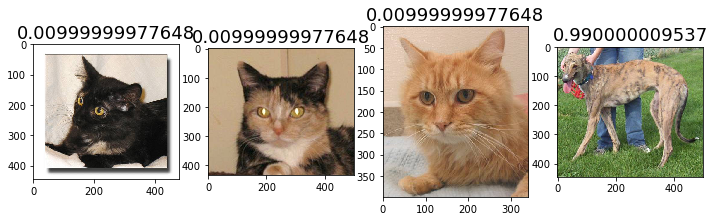

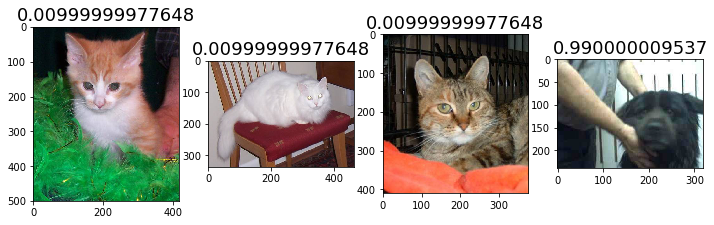

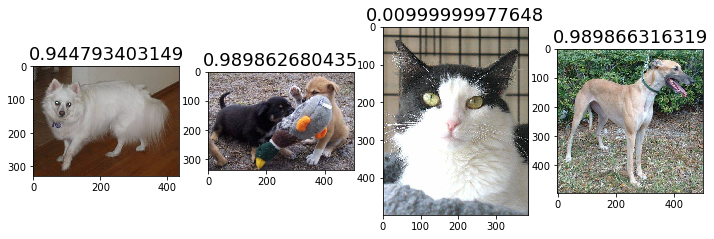

In [145]:
num_images = 16
start = start + num_images
end = start + num_images
full_paths = [os.path.join('test', filename) for filename in test_filenames]
plot_files(full_paths[start:end], titles=predictions[start:end, 1],
           images_per_row=4)

#### Export the predictions to csv with Pandas.

In [146]:
import pandas as pd
now = datetime.datetime.now()
date_string = "{0}.{1}-{2}.{3}.{4}".format(
    now.day, now.month, now.hour, now.minute, now.second)
filename = ("cats_dogs-{0}.csv".format(date_string))
header = ['id', 'label']
df = pd.DataFrame(predictions)
# Convert ids (first column) to int
df[0] = df[0].astype(int)
df.to_csv(filename, header=header, index=False)
FileLink(filename)

/home/ubuntu/data/course/cats-dogs/cats_dogs-2.3-19.40.9.csv

#### Submit to kaggle

In [147]:
!kg submit -c 'dogs-vs-cats-redux-kernels-edition' -m "$date_string" $filename